In [1]:
%cd /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/CDHU-katrin_youtube_dalia/yolov5 

/zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/CDHU-katrin_youtube_dalia/yolov5


In [2]:
import torch
import utils
from IPython import display
from IPython.display import clear_output
from pathlib import Path
import yaml
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
def rename_df_cols(df):
    old_cols = list(df.columns)
    new_cols = ['epoch', 'train/box_loss', 'train/obj_loss',
       'train/cls_loss', 'metrics/precision', 'metrics/recall',
       'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', 'val/box_loss',
       'val/obj_loss', 'val/cls_loss', '/lr0', 'x/lr1', 'x/lr2']
    aux = dict(zip(old_cols, new_cols))
    df = df.rename(columns=aux)
    return df

def plot_losses(df_results):
    df_results.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'])
    plt.xlabel("Epoch")
    plt.ylabel("Cls_loss")
    #plt.show()

## Training dataset preparation

In [4]:
data_path = '/zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/spain_paths.yaml'

## Model training: base model

### Fine tune: batch size

In [5]:
# Set batch size 

batch_s = [16,32,64]

for batch in batch_s:
    # Give a name to the model
    model_name = f'b{batch}_e200_f12'
    print(f'**************TRAINING MODEL {model_name}*********')
    
    # Train
    !python train.py --batch {batch} \
    --epochs 200 \
    --data {data_path} \
    --weights yolov5s6.pt \
    --cache \
    --freeze 12 \
    --project Spain \
    --name {model_name}

**************TRAINING MODEL b16_e200_f12*********
train: weights=yolov5s6.pt, cfg=, data=/zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/spain_paths.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=Spain, name=b16_e200_f12, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 42 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.10.8 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 5000, 16125MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0

WARNING ⚠️ DP not recommended, use torch.distributed.run for best DDP Multi-GPU results.
See Multi-GPU Tutorial at https://github.com/ultralytics/yolov5/issues/475 to get started.
train: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-mea
train: New cache created: /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/labels/train.cache
train: Caching images (0.2GB ram): 100%|██████████| 210/210 [00:00<00:00, 270.77
val: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means
val: New cache created: /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/labels/val.cache
val: Caching images (0.0GB ram): 100%|██████████| 59/59 [00:00<00:00, 106.64it/s

AutoAnchor: 4.04 anchors/target, 0.993 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Plotting labels to Spain/b16_e200_f12/labels.jpg... 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Spai

     21/199      1.97G    0.04901    0.01348   0.003848          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.722      0.549        0.6      0.293

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     22/199      1.97G    0.04842    0.01372   0.005634          7        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.819      0.624       0.68       0.29

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     23/199      1.97G    0.04596    0.01395   0.003437         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.701      0.624      0.643      0.332

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     24/19

     46/199      1.97G    0.03734    0.01063    0.00236          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.829      0.693       0.74      0.462

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     47/199      1.97G    0.03986    0.01118   0.003211         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.85      0.705      0.752       0.45

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     48/199      1.97G    0.03851    0.01233     0.0026         42        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.787      0.741      0.748      0.477

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     49/19

     71/199      1.97G    0.02673    0.01006   0.001413         12        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.815      0.793      0.783      0.496

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     72/199      1.97G    0.02959    0.01065   0.001602         16        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.826      0.772      0.769      0.517

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     73/199      1.97G    0.02795   0.008991   0.001329          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.83      0.781      0.772      0.466

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     74/19

     96/199      1.97G     0.0239    0.01028   0.001132         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.875      0.783      0.803      0.536

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     97/199      1.97G    0.02597   0.008875  0.0009412          8        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.852      0.777      0.787      0.542

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     98/199      1.97G    0.02344   0.008112   0.001107          7        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.86      0.761       0.79      0.544

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     99/19

    121/199      1.97G    0.02158   0.009592   0.001077         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.87      0.773      0.781      0.551

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    122/199      1.97G    0.02134   0.008113   0.001029         15        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.871      0.798      0.795      0.541

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    123/199      1.97G    0.02159   0.008466  0.0009122          8        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.883        0.8      0.795      0.555

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    124/19

    146/199      1.97G    0.01911   0.009334   0.001588         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.843      0.813        0.8      0.564

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    147/199      1.97G    0.01819   0.007676  0.0007462         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.861      0.804      0.801      0.579

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    148/199      1.97G    0.01947   0.008085  0.0006528          3        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.878      0.808      0.798      0.572

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    149/19

    171/199      1.97G    0.01603   0.008192  0.0006309         20        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.866      0.801      0.796      0.572

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    172/199      1.97G    0.01561   0.006962  0.0005119          4        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.866      0.801      0.794      0.577

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    173/199      1.97G    0.01673   0.008665   0.001617          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.871      0.796      0.794      0.579

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    174/19

    196/199      1.97G    0.01474   0.007523  0.0003214          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.862      0.801      0.802      0.581

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    197/199      1.97G     0.0146   0.007392  0.0003694          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.865      0.801      0.802      0.584

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    198/199      1.97G    0.01407   0.007242  0.0003112          4        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.865      0.801      0.802      0.578

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    199/19

WARNING ⚠️ DP not recommended, use torch.distributed.run for best DDP Multi-GPU results.
See Multi-GPU Tutorial at https://github.com/ultralytics/yolov5/issues/475 to get started.
train: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-mea
train: Caching images (0.2GB ram): 100%|██████████| 210/210 [00:00<00:00, 435.89
val: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means
val: Caching images (0.0GB ram): 100%|██████████| 59/59 [00:00<00:00, 75.67it/s]

AutoAnchor: 4.04 anchors/target, 0.993 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Plotting labels to Spain/b32_e200_f12/labels.jpg... 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Spain/b32_e200_f12
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      0/199      1.47G     0.1185    0.02518    0.03086         74        640: 1
                 Class     Images  Inst

     22/199      3.28G    0.05306    0.01396   0.004584         88        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.485      0.566       0.47      0.199

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     23/199      3.28G    0.05043    0.01449   0.004461        113        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.462      0.529      0.432      0.153

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     24/199      3.28G    0.05112    0.01357   0.005048         83        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107        0.5      0.609      0.543      0.215

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     25/19

     47/199      3.28G    0.03873    0.01036   0.003033         81        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.786      0.729      0.732      0.418

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     48/199      3.28G    0.03698     0.0109    0.00381         54        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.761       0.73      0.742      0.437

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     49/199      3.28G    0.03661    0.01106   0.003014         65        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.856      0.642      0.723      0.395

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     50/19

     72/199      3.28G    0.02917   0.009444   0.001684         96        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.797      0.758       0.76      0.479

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     73/199      3.28G     0.0284   0.009572   0.001467         91        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.805      0.753      0.769      0.488

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     74/199      3.28G    0.03052   0.009793   0.001318         70        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.792      0.758      0.761      0.464

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     75/19

     97/199      3.28G    0.02597   0.008074   0.001044         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.845      0.734      0.768      0.515

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     98/199      3.28G     0.0266    0.00811  0.0009633        110        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.834      0.746      0.776      0.532

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     99/199      3.28G    0.02442   0.009156   0.001169        111        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.833      0.751      0.776      0.508

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    100/19

    122/199      3.28G    0.02266   0.008623    0.00122         75        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.81      0.786      0.777       0.52

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    123/199      3.28G    0.02074   0.007956  0.0009054         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.806      0.783      0.782      0.536

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    124/199      3.28G      0.023   0.008001  0.0007809         82        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.789      0.788      0.776      0.527

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    125/19

    147/199      3.28G    0.01812    0.00742  0.0008716         55        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.842      0.771      0.795      0.558

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    148/199      3.28G    0.01833   0.007876  0.0005996         74        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.844      0.778      0.797      0.566

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    149/199      3.28G     0.0178   0.007658   0.000642         56        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.853      0.771      0.797      0.563

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    150/19

    172/199      3.28G    0.01667     0.0077   0.000531         70        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.805      0.811      0.791      0.562

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    173/199      3.28G    0.01549   0.007304  0.0004735         58        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.816      0.789       0.79      0.559

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    174/199      3.28G    0.01552    0.00723  0.0005199         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.823      0.772      0.791      0.565

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    175/19

    197/199      3.28G     0.0133   0.007038  0.0003463         68        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.865      0.761      0.798      0.578

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    198/199      3.28G     0.0137   0.007179  0.0003302         76        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.857      0.754      0.791      0.577

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    199/199      3.28G    0.01392   0.006513  0.0003101         72        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.858      0.766      0.799      0.576

200 epochs completed in 0.123 hours.
Optimizer stripped from Spain/b32_e200_f12/weights/

WARNING ⚠️ DP not recommended, use torch.distributed.run for best DDP Multi-GPU results.
See Multi-GPU Tutorial at https://github.com/ultralytics/yolov5/issues/475 to get started.
train: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-mea
train: Caching images (0.2GB ram): 100%|██████████| 210/210 [00:00<00:00, 437.18
val: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means
val: Caching images (0.0GB ram): 100%|██████████| 59/59 [00:00<00:00, 62.11it/s]

AutoAnchor: 4.04 anchors/target, 0.993 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Plotting labels to Spain/b64_e200_f12/labels.jpg... 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Spain/b64_e200_f12
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      0/199      2.94G     0.1198     0.0251    0.03158         78        640: 1
                 Class     Images  Inst

     22/199      4.58G    0.06074    0.01679    0.00712         81        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.402      0.487      0.349      0.127

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     23/199      4.58G    0.05634    0.01704   0.005847         96        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.395      0.561      0.336      0.114

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     24/199      4.58G     0.0592    0.01599   0.005518         92        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.405      0.468      0.351      0.115

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     25/19

     47/199      4.58G    0.03884    0.01116   0.002626         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.666      0.659      0.669      0.387

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     48/199      4.58G    0.03768     0.0118   0.003091        101        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.735      0.684      0.716      0.417

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     49/199      4.58G    0.03618    0.01154   0.002645        100        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.678      0.669       0.68      0.394

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     50/19

     72/199      4.58G    0.02994   0.009633   0.001769         85        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.835      0.753      0.769      0.486

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     73/199      4.58G    0.03251   0.008998   0.001414         58        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.832      0.713      0.763      0.481

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     74/199      4.58G    0.03018    0.01077   0.001706         85        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.834      0.713      0.756      0.448

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     75/19

     97/199      4.58G    0.02632    0.01041   0.001364         80        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.775      0.764      0.763      0.485

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     98/199      4.58G    0.02531   0.009165   0.001189         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.848      0.708      0.769      0.502

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     99/199      4.58G    0.02461   0.008996   0.001303         97        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.791      0.756      0.778      0.499

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    100/19

    122/199      4.58G    0.02076   0.008861  0.0009386         99        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.849      0.793       0.78      0.533

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    123/199      4.58G    0.02058   0.008384  0.0009032         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.821      0.787      0.778      0.535

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    124/199      4.58G    0.02057   0.007361  0.0009138         65        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.841      0.773      0.776      0.516

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    125/19

    147/199      4.58G    0.01876   0.008021  0.0006143         94        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.825      0.772      0.785      0.554

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    148/199      4.58G    0.01861   0.007217  0.0006281         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.848      0.759      0.788      0.557

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    149/199      4.58G    0.01801   0.007711     0.0013         67        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.857      0.781      0.787      0.541

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    150/19

    172/199      4.58G     0.0161   0.007611  0.0004573         97        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.858      0.771      0.789      0.563

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    173/199      4.58G    0.01628   0.007172  0.0003964         91        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.861      0.768      0.795      0.572

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    174/199      4.58G     0.0156   0.007364   0.000438         87        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.858      0.778       0.79      0.569

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    175/19

    197/199      4.58G    0.01405   0.007451  0.0002952        107        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.849      0.778      0.789      0.571

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    198/199      4.58G    0.01339   0.007373  0.0003325        110        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.835      0.778      0.789      0.571

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    199/199      4.58G    0.01326   0.006674  0.0003171         51        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.829      0.778      0.789      0.569

200 epochs completed in 0.106 hours.
Optimizer stripped from Spain/b64_e200_f12/weights/

In [6]:
# Read results
results_b16 = rename_df_cols(pd.read_csv(f'Spain/b16_e200_f12/results.csv'))
results_b32 = rename_df_cols(pd.read_csv(f'Spain/b32_e200_f12/results.csv'))
results_b64 = rename_df_cols(pd.read_csv(f'Spain/b64_e200_f12/results.csv'))

### Plot: batch size comparision 

Text(0.5, 1.0, 'Spain: b64_e200_f12')

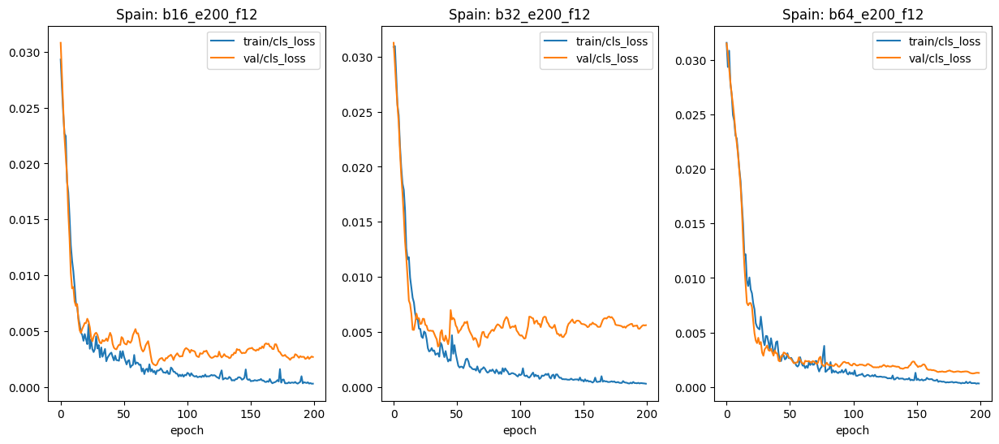

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 6))
# base_two_clases_b16_e150_f122
results_b16.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[0]) 
# base_two_clases_b32_e150_f122
results_b32.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[1])
# base_two_clases_b64_e150_f122
results_b64.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[2])

# Set individual title 
axes[0].set_title('Spain: b16_e200_f12')
axes[1].set_title('Spain: b32_e200_f12')
axes[2].set_title('Spain: b64_e200_f12')

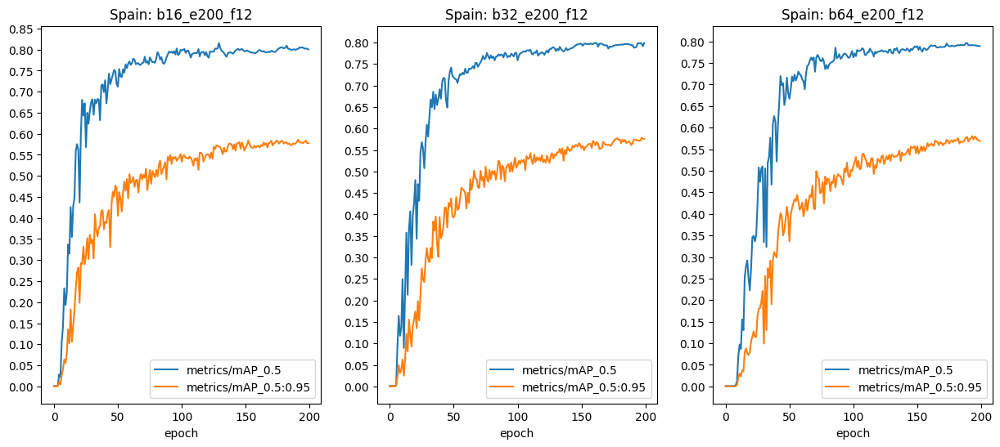

In [8]:
import matplotlib.ticker as ticker

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 6))
# base_two_clases_b16_e150_f122
results_b16.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], ax=axes[0]) 
# base_two_clases_b32_e150_f122
results_b32.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], ax=axes[1])
# base_two_clases_b64_e150_f122
results_b64.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], ax=axes[2])

# Set individual title 
axes[0].set_title('Spain: b16_e200_f12')
axes[1].set_title('Spain: b32_e200_f12')
axes[2].set_title('Spain: b64_e200_f12')

axes[0].yaxis.set_major_locator(ticker.MultipleLocator(0.05))
axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.05))
axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.05))


In [9]:
print(results_b16['metrics/mAP_0.5'].max(), results_b16['metrics/mAP_0.5:0.95'].max())

print(results_b32['metrics/mAP_0.5'].max(), results_b32['metrics/mAP_0.5:0.95'].max())

print(results_b64['metrics/mAP_0.5'].max(), results_b64['metrics/mAP_0.5:0.95'].max())

0.81539 0.58563
0.79871 0.57818
0.79619 0.58036


#### Okay, the best model is with batch 32

## Medium model 

In [10]:
# Set batch size 

batch_s = [16,32,64]

for batch in batch_s:
    # Give a name to the model
    model_name = f'b{batch}_e200_f12_v5m6'
    print(f'**************TRAINING MODEL {model_name}*********')
    
    # Train
    !python train.py --batch {batch} \
    --epochs 200 \
    --data {data_path} \
    --weights yolov5m6.pt \
    --cache \
    --freeze 12 \
    --project Spain \
    --name {model_name}

**************TRAINING MODEL b16_e200_f12_v5m6*********
train: weights=yolov5m6.pt, cfg=, data=/zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/spain_paths.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=Spain, name=b16_e200_f12_v5m6, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 42 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.10.8 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 5000, 16125MiB)

hyperparameters: lr0=0.01, lrf=0.01, 

WARNING ⚠️ DP not recommended, use torch.distributed.run for best DDP Multi-GPU results.
See Multi-GPU Tutorial at https://github.com/ultralytics/yolov5/issues/475 to get started.
train: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-mea
train: Caching images (0.2GB ram): 100%|██████████| 210/210 [00:00<00:00, 439.67
val: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means
val: Caching images (0.0GB ram): 100%|██████████| 59/59 [00:00<00:00, 134.15it/s

AutoAnchor: 4.04 anchors/target, 0.993 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Plotting labels to Spain/b16_e200_f12_v5m6/labels.jpg... 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Spain/b16_e200_f12_v5m6
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      0/199      1.43G     0.1101     0.0256    0.02903          5        640: 1
                 Class     Im

     22/199      3.21G     0.0476    0.01181   0.003347          7        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.613      0.703      0.681      0.343

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     23/199      3.21G     0.0421    0.01208   0.004241         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.577      0.646      0.585      0.302

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     24/199      3.21G     0.0419    0.01073   0.005609          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.722      0.641      0.657      0.348

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     25/19

     47/199      3.21G    0.03022   0.009654   0.002852         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.767       0.76      0.787      0.526

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     48/199      3.21G    0.03066    0.01015    0.00241         42        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.802       0.72      0.796       0.52

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     49/199      3.21G    0.03121   0.009129   0.002252         12        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.885      0.656      0.778      0.514

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     50/19

     72/199      3.21G    0.02573   0.008806   0.001955         16        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.863      0.704        0.8      0.561

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     73/199      3.21G    0.02538   0.007391   0.001111          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.869      0.693      0.793      0.554

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     74/199      3.21G    0.02691   0.008496   0.001255         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.876       0.69      0.782      0.557

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     75/19

     97/199      3.21G    0.02132   0.007174   0.001359          8        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.84      0.785      0.806      0.596

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     98/199      3.21G     0.0216   0.006732   0.001204          7        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.865      0.773      0.802      0.591

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     99/199      3.21G     0.0212    0.00717   0.001372          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.901      0.738      0.801      0.577

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    100/19

    122/199      3.21G    0.01868   0.006569  0.0009173         15        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.888      0.743      0.799      0.593

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    123/199      3.21G     0.0169   0.006772  0.0008995          8        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.872      0.774      0.805      0.599

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    124/199      3.21G    0.01717   0.006045  0.0008876          6        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.898      0.784      0.807      0.593

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    125/19

    147/199      3.21G    0.01561   0.006256  0.0006643         10        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.875      0.778      0.809      0.597

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    148/199      3.21G    0.01544    0.00653  0.0006592          3        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.905      0.769       0.81      0.606

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    149/199      3.21G    0.01501   0.006122   0.002578          8        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.902      0.768      0.811      0.605

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    150/19

    172/199      3.21G    0.01258   0.005431  0.0004784          4        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.872      0.771      0.807      0.611

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    173/199      3.21G    0.01325   0.007177  0.0006433          5        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.87      0.778      0.807       0.62

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    174/199      3.21G     0.0124   0.005755  0.0004805         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.877      0.778      0.808      0.625

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    175/19

    197/199      3.21G    0.01062   0.005627  0.0003279          9        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.829      0.796       0.81       0.63

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    198/199      3.21G    0.01023   0.005509  0.0003112          4        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.853      0.778      0.809      0.631

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    199/199      3.21G    0.01015   0.005923  0.0003052         14        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.872      0.778      0.809      0.629

200 epochs completed in 0.239 hours.
Optimizer stripped from Spain/b16_e200_f12_v5m6/wei

optimizer: SGD(lr=0.01) with parameter groups 103 weight(decay=0.0), 107 weight(decay=0.0005), 107 bias
WARNING ⚠️ DP not recommended, use torch.distributed.run for best DDP Multi-GPU results.
See Multi-GPU Tutorial at https://github.com/ultralytics/yolov5/issues/475 to get started.
train: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-mea
train: Caching images (0.2GB ram): 100%|██████████| 210/210 [00:00<00:00, 438.87
val: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means
val: Caching images (0.0GB ram): 100%|██████████| 59/59 [00:00<00:00, 124.96it/s

AutoAnchor: 4.04 anchors/target, 0.993 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Plotting labels to Spain/b32_e200_f12_v5m6/labels.jpg... 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Spain/b32_e200_f12_v5m6
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     22/199      5.27G    0.04682    0.01293   0.005022         88        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.518      0.641      0.513      0.239

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     23/199      5.27G    0.04606    0.01278   0.004483        113        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.548      0.654      0.576      0.261

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     24/199      5.27G    0.04604    0.01194   0.004086         83        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.618      0.621      0.638      0.332

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     47/199      5.27G    0.03359   0.008798   0.002964         81        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.87      0.706      0.807      0.512

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     48/199      5.27G    0.03472   0.009138   0.002769         54        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.883      0.725      0.802      0.459

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     49/199      5.27G    0.03521   0.009466    0.00252         65        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.812      0.756      0.798      0.489

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     72/199      5.27G    0.02626   0.007859   0.001352         96        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.879      0.706      0.789      0.504

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     73/199      5.27G    0.02657   0.008021    0.00159         91        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.811      0.753      0.786       0.51

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     74/199      5.27G    0.02531    0.00844   0.001613         70        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.844      0.745      0.784      0.534

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     97/199      5.27G    0.02163   0.006744   0.001175         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.921      0.735      0.794      0.558

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     98/199      5.27G    0.02292   0.006954   0.001062        110        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.928      0.736        0.8      0.562

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     99/199      5.27G     0.0196    0.00767   0.001155        111        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.929      0.727      0.806      0.539

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    122/199      5.27G    0.01859   0.007117  0.0009462         75        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.918      0.734      0.803      0.574

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    123/199      5.27G    0.01744   0.006444  0.0009313         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.902      0.731      0.812      0.593

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    124/199      5.27G    0.01838   0.006428   0.000866         82        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.927      0.729      0.809      0.605

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    147/199      5.27G    0.01525   0.005862  0.0006423         55        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.924      0.745      0.802      0.603

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    148/199      5.27G    0.01533   0.006274   0.000706         74        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.939      0.732      0.804      0.605

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    149/199      5.27G    0.01428   0.006027  0.0006992         56        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.934      0.728      0.805      0.605

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    172/199      5.27G    0.01275   0.006061  0.0004761         70        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.926      0.743      0.806      0.603

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    173/199      5.27G    0.01228   0.005848  0.0004306         58        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.932      0.743      0.806      0.599

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    174/199      5.27G    0.01218    0.00567  0.0005021         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.921      0.738      0.807      0.607

      Epo


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    197/199      5.27G   0.009714   0.005243  0.0003054         68        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.919      0.736      0.807      0.607

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    198/199      5.27G    0.01028   0.005541  0.0003083         76        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.921      0.736      0.808      0.607

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    199/199      5.27G   0.009977   0.005006  0.0002737         72        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.929      0.742      0.808      0.613

200 epoch

WARNING ⚠️ DP not recommended, use torch.distributed.run for best DDP Multi-GPU results.
See Multi-GPU Tutorial at https://github.com/ultralytics/yolov5/issues/475 to get started.
train: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-mea
train: Caching images (0.2GB ram): 100%|██████████| 210/210 [00:00<00:00, 435.44
val: Scanning /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means
val: Caching images (0.0GB ram): 100%|██████████| 59/59 [00:00<00:00, 70.03it/s]

AutoAnchor: 4.04 anchors/target, 0.993 Best Possible Recall (BPR). Current anchors are a good fit to dataset ✅
Plotting labels to Spain/b64_e200_f12_v5m6/labels.jpg... 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Spain/b64_e200_f12_v5m6
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      0/199      4.61G       0.12      0.026    0.03043         78        640: 1
                 Class     Im

     22/199      7.09G    0.05619    0.01548   0.007085         81        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.532      0.534      0.553      0.223

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     23/199      7.09G     0.0544    0.01534   0.006135         96        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.503      0.511      0.474      0.168

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     24/199      7.09G    0.05469    0.01507   0.006341         92        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.404      0.591       0.51       0.21

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     25/19

     47/199      7.09G    0.03699   0.009631   0.002965         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.755      0.686       0.77      0.445

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     48/199      7.09G    0.03425    0.01009   0.002726        101        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.656      0.701      0.687      0.396

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     49/199      7.09G     0.0334    0.01008   0.002464        100        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.827      0.702      0.785       0.49

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     50/19

     72/199      7.09G    0.02672    0.00789   0.002246         85        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.861      0.711      0.796      0.552

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     73/199      7.09G    0.02564   0.007549    0.00196         58        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.708      0.745      0.761      0.503

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     74/199      7.09G    0.02911   0.009008   0.001948         85        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.882      0.639      0.782      0.531

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     75/19

     97/199      7.09G    0.02258   0.008566   0.001395         80        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.811      0.753      0.783      0.528

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     98/199      7.09G    0.02155   0.007625   0.001463         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.914      0.704      0.785      0.532

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     99/199      7.09G    0.02134   0.007536   0.001436         97        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.898      0.717      0.788      0.507

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    100/19

    122/199      7.09G    0.01848   0.007259   0.001078         99        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.949      0.689      0.798      0.563

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    123/199      7.09G    0.01822   0.006617    0.00113         71        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.943      0.696      0.797       0.58

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    124/199      7.09G    0.01753   0.005749   0.001082         65        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.953      0.696      0.792       0.58

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    125/19

    147/199      7.09G    0.01496   0.006458   0.000644         94        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.948      0.701      0.803      0.583

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    148/199      7.09G    0.01579   0.005631  0.0005889         79        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.951      0.696      0.806      0.603

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    149/199      7.09G    0.01604   0.006398   0.000768         67        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.958      0.696      0.799      0.576

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    150/19

    172/199      7.09G    0.01258   0.006004  0.0005692         97        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.944      0.707      0.811      0.599

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    173/199      7.09G     0.0126   0.005435  0.0004117         91        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.949      0.708      0.811      0.614

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    174/199      7.09G    0.01214   0.005736  0.0005327         87        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.954      0.709      0.806      0.617

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    175/19

    197/199      7.09G   0.009933   0.005689  0.0003088        107        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.935      0.717      0.805      0.622

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    198/199      7.09G   0.009995   0.005835  0.0003179        110        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107      0.934      0.717       0.81      0.628

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
    199/199      7.09G   0.009565   0.005103  0.0003018         51        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all         59        107       0.93      0.717      0.811      0.619

200 epochs completed in 0.161 hours.
Optimizer stripped from Spain/b64_e200_f12_v5m6/wei

In [11]:
# Read results
results_b16_v5m6 = rename_df_cols(pd.read_csv(f'Spain/b16_e200_f12_v5m6/results.csv'))
results_b32_v5m6 = rename_df_cols(pd.read_csv(f'Spain/b32_e200_f12_v5m6/results.csv'))
results_b64_v5m6 = rename_df_cols(pd.read_csv(f'Spain/b64_e200_f12_v5m6/results.csv'))

Text(0.5, 1.0, 'b64_e200_f12_v5m6')

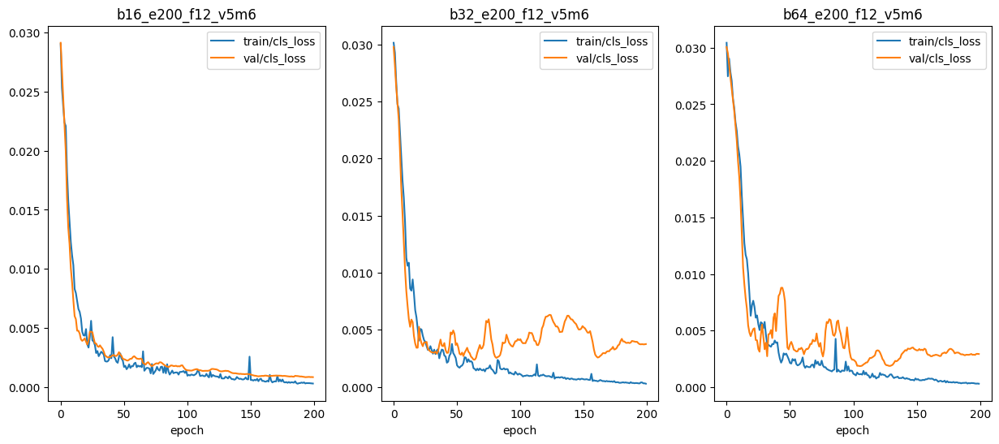

In [12]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 6))
# base_two_clases_b16_e150_f122
results_b16_v5m6.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[0])
# base_two_clases_b32_e150_f122
results_b32_v5m6.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[1])
# base_two_clases_b64_e150_f122
results_b64_v5m6.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[2])

# Set individual title 
axes[0].set_title('b16_e200_f12_v5m6')
axes[1].set_title('b32_e200_f12_v5m6')
axes[2].set_title('b64_e200_f12_v5m6')

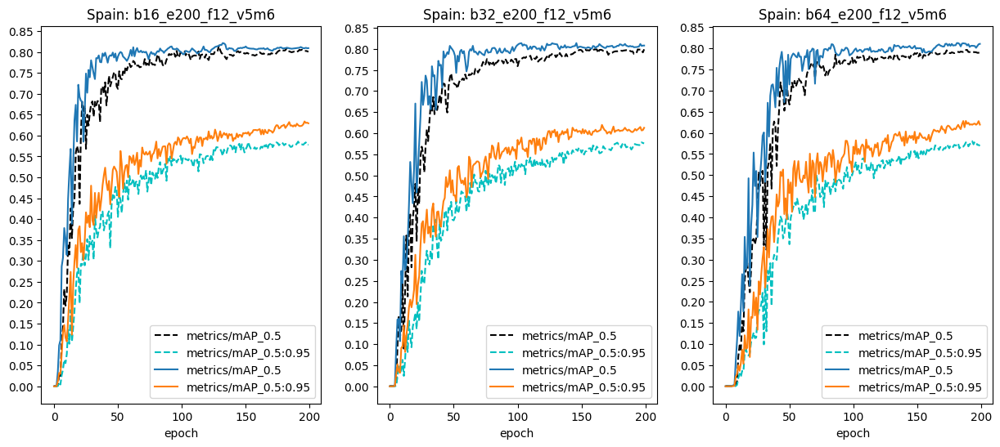

In [36]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 6))
# base_two_clases_b16_e150_f122
results_b16.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], linestyle='--',color=['k','c'],ax=axes[0])
results_b16_v5m6.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], ax=axes[0])
# base_two_clases_b32_e150_f122
results_b32.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'],linestyle='--', color=['k','c'],ax=axes[1])
results_b32_v5m6.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], ax=axes[1])
# base_two_clases_b64_e150_f122
results_b64.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], linestyle='--', color=['k','c'],ax=axes[2])
results_b64_v5m6.plot(x='epoch', y=['metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'], ax=axes[2])

# Set individual title 
axes[0].set_title('Spain: b16_e200_f12_v5m6')
axes[1].set_title('Spain: b32_e200_f12_v5m6')
axes[2].set_title('Spain: b64_e200_f12_v5m6')

axes[0].yaxis.set_major_locator(ticker.MultipleLocator(0.05))
axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.05))
axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.05))

Text(0.5, 1.0, 'b64_e200_f12_v5m6')

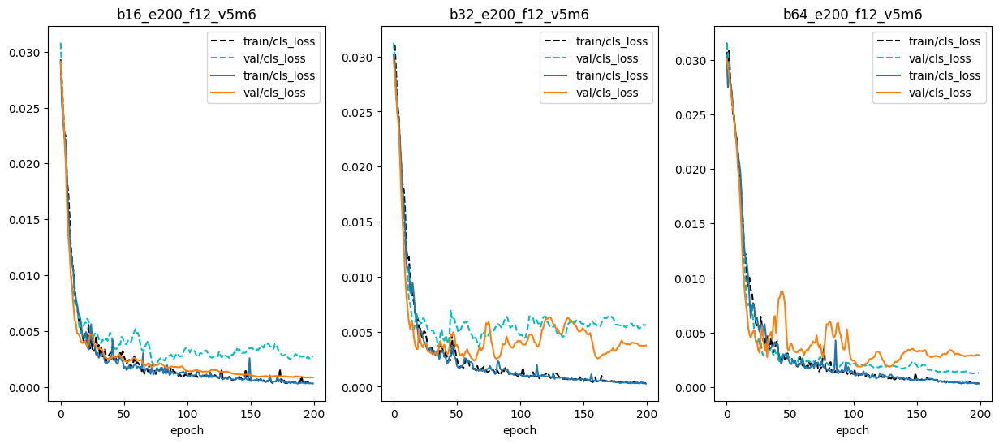

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 6))
# base_two_clases_b16_e150_f122
results_b16.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], linestyle='--',color=['k','c'], ax=axes[0])
results_b16_v5m6.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[0])
# base_two_clases_b32_e150_f122
results_b32.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], linestyle='--',color=['k','c'], ax=axes[1])
results_b32_v5m6.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[1])
# base_two_clases_b64_e150_f122
results_b64.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], linestyle='--',color=['k','c'], ax=axes[2])
results_b64_v5m6.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'], ax=axes[2])

# Set individual title 
axes[0].set_title('b16_e200_f12_v5m6')
axes[1].set_title('b32_e200_f12_v5m6')
axes[2].set_title('b64_e200_f12_v5m6')

In [14]:
print(results_b16_v5m6['metrics/mAP_0.5'].max(),results_b16_v5m6['metrics/mAP_0.5:0.95'].max())

print(results_b32_v5m6['metrics/mAP_0.5'].max(),results_b32_v5m6['metrics/mAP_0.5:0.95'].max())

print(results_b64_v5m6['metrics/mAP_0.5'].max(),results_b64_v5m6['metrics/mAP_0.5:0.95'].max())

0.8212 0.63378
0.8135 0.61958
0.81242 0.62812


In [15]:
print(results_b16_v5m6['train/cls_loss'].min())
print(results_b16_v5m6['val/cls_loss'].min())

print(results_b32_v5m6['train/cls_loss'].min())
print(results_b32_v5m6['val/cls_loss'].min())

print(results_b64_v5m6['train/cls_loss'].min())
print(results_b64_v5m6['val/cls_loss'].min())

0.0002903
0.00084282
0.00027369
0.0023792
0.00030183
0.0018577


### Model testing

In [40]:
def rename_df_cols(df):
    old_cols = list(df.columns)
    new_cols = ['epoch', 'train/box_loss', 'train/obj_loss',
       'train/cls_loss', 'metrics/precision', 'metrics/recall',
       'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', 'val/box_loss',
       'val/obj_loss', 'val/cls_loss', '/lr0', 'x/lr1', 'x/lr2']
    aux = dict(zip(old_cols, new_cols))
    df = df.rename(columns=aux)
    return df

def plot_losses(df_results):
    df_results.plot(x='epoch', y=['train/cls_loss', 'val/cls_loss'])
    plt.xlabel("Epoch")
    plt.ylabel("Cls_loss")
    #plt.show()
    

def modify_lr_hyperparam(hyperparam_file_path:str, lr_new:float):
    with open(hyperparam_file_path, 'r') as f:
        yaml_dict = yaml.safe_load(f)
        
        # Modify the 'lr' value in the sixth line
        yaml_dict['lr0'] = lr_new
        #print(yaml_dict['lr0'])
        
    # Write the modified YAML back to the file
    with open(hyperparam_file_path, 'w') as f:
        yaml.dump(yaml_dict, f)
        
        
"""degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.9  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.1  # image mixup (probability)
"""

def hyperparam_tuning(hyperparam_file_path:str, lr_new=0.1, degrees_new=0.0, translate_new=0.1, scale_new=0.9, shear_new=0.0, perspective_new=0.0, 
                      flipud_new=0.0, fliplr_new=0.5, mosaic_new=1.0, mixup_new=0.1):
    
    # Open hyperparamentes file 
    with open(hyperparam_file_path, 'r') as f:
        yaml_dict = yaml.safe_load(f)
        
        # Modify the 'lr' value in the sixth line
        yaml_dict['lr0'] = lr_new
        yaml_dict['degrees'] = degrees_new
        yaml_dict['translate']= translate_new
        yaml_dict['scale']= scale_new
        yaml_dict['shear']= shear_new
        yaml_dict['perspective']= perspective_new
        yaml_dict['flipud']= flipud_new
        yaml_dict['fliplr']= fliplr_new
        yaml_dict['mosaic']= mosaic_new
        yaml_dict['mixup']= mixup_new
        
        
    # Write the modified YAML back to the file
    with open(hyperparam_file_path, 'w') as f:
        yaml.dump(yaml_dict, f)
        

# Function to show validation predictions saved during training.
def show_valid_results(results_model_path, figure_size):
    validation_pred_images = glob.glob(f"{results_model_path}/*_pred.jpg")
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=figure_size)
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [53]:
# Bringing best model from previous experiments
model_name = 'b16_e200_f12_v5m6'
results_s6 = rename_df_cols(pd.read_csv(f'Spain/{model_name}/results.csv'))

In [51]:
def run_detection(model_name:str, test_data_path:str):
    model_path = f'Spain/{model_name}/weights/best.pt'
    test_folder_path = f'{model_name}_TEST'
    
    !python detect.py \
    --weights {model_path} \
    --source {test_data_path} \
    --project Spain \
    --name {test_folder_path}
    
def show_test_results(model_name, figure_size):
    test_path = f'Spain/{model_name}_TEST'
    test_images = glob.glob(f"{test_path}/*.jpeg")
    for pred_image in test_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=figure_size)
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [54]:
run_detection(model_name, '/zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/images/test/')

detect: weights=['Spain/b16_e200_f12_v5m6/weights/best.pt'], source=/zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/images/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=Spain, name=b16_e200_f12_v5m6_TEST, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.10.8 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 5000, 16125MiB)

Fusing layers... 
Model summary: 276 layers, 35254692 parameters, 0 gradients, 48.9 GFLOPs
image 1/29 /zpool/beast-mirror/labour-movements-mobilisation-via-visual-means/datasets/spain/images/test/España_Izquierda_unida_partido211.jpeg: 384x640 1 e_iu, 46.0ms
image 2/29 /zpool/beast-mirror/labour-movements-mobilisation-via-visual-me

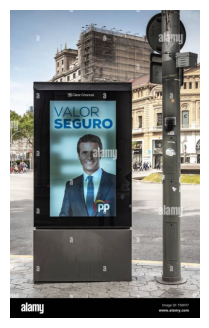

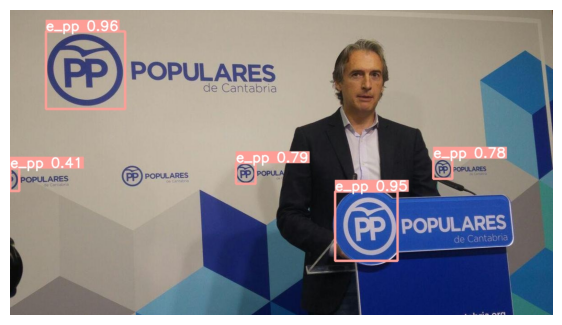

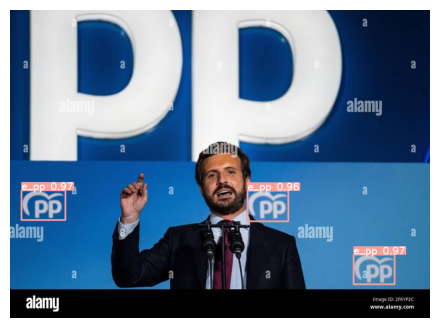

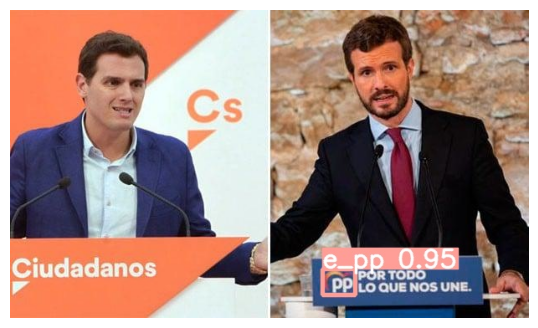

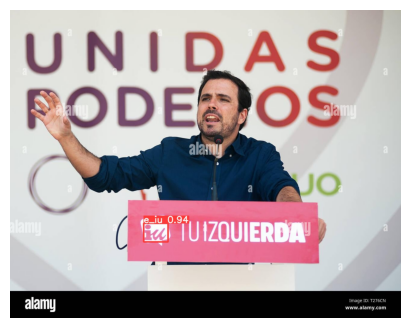

...

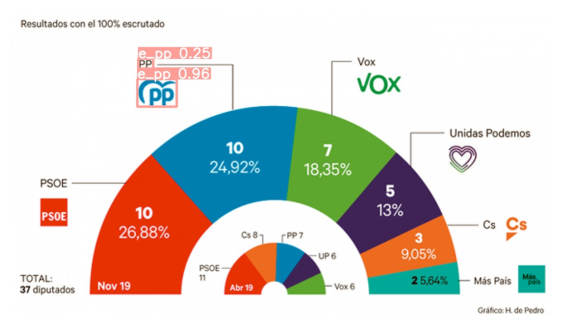

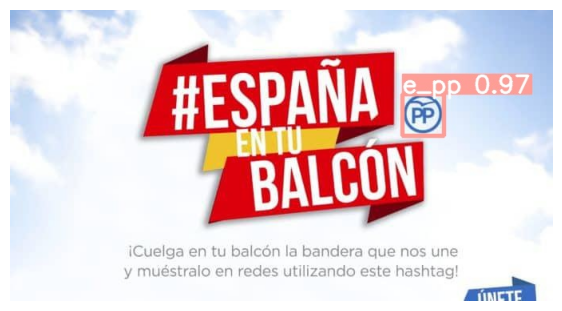

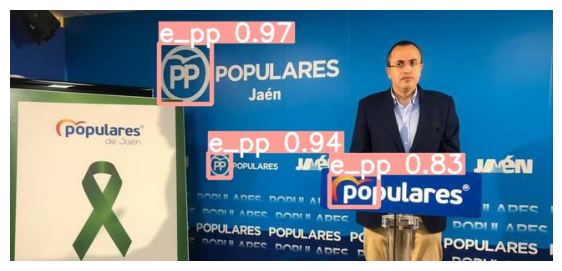

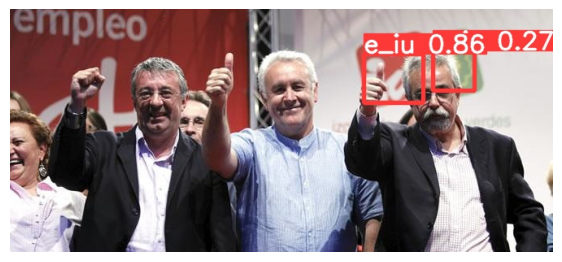

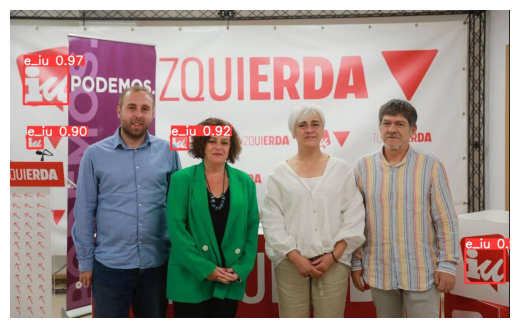

In [56]:
import cv2
show_test_results(model_name,(7,4))

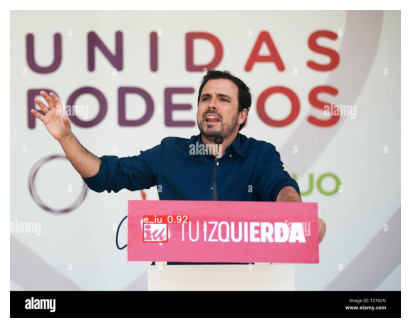

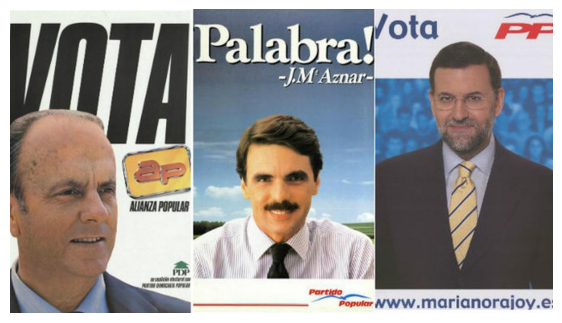

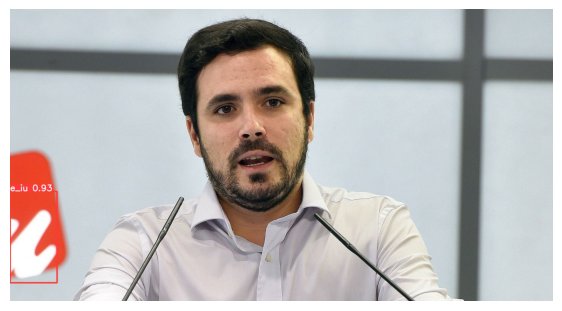

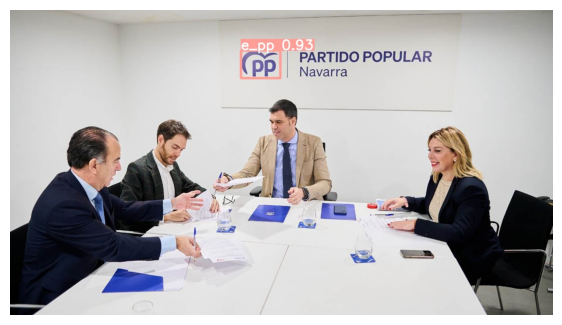

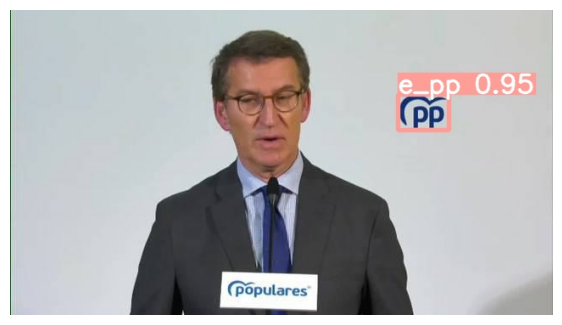

...

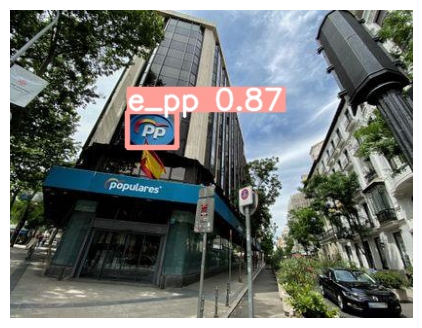

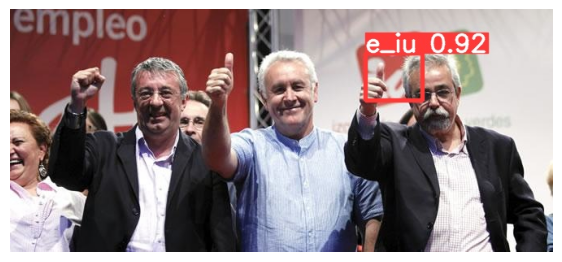

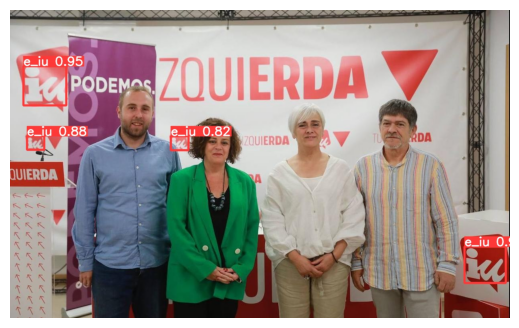

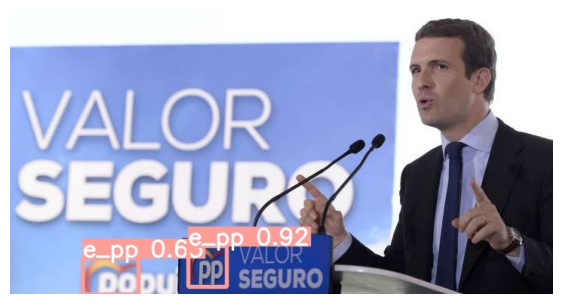

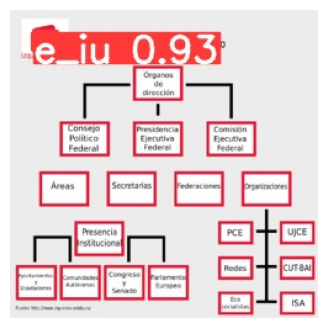

In [57]:
show_test_results('b64_e200_f12',(7,4))